In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

#### Acknowledgements

Many broad approaches were brainstormed with Sophia Hager. Python for Data Analysis Chapter 8, Google, and cited Googled sources have been crucial to the data wrangling in this project. Any borrowed syntax/code is commented within the code block.

In [361]:
# read in data
# from https://www.kaggle.com/bahramjannesarr/goodreads-book-datasets-10m

books1 = pd.read_csv("./archive/user_rating_0_to_1000.csv")
books2 = pd.read_csv("./archive/user_rating_1000_to_2000.csv")
books3 = pd.read_csv("./archive/user_rating_2000_to_3000.csv")

In [362]:
books = pd.concat([books1, books2])#, books3])

In [363]:
books.shape

(94931, 3)

In [364]:
small_books = books[books['Rating'] != "This user doesn't have any rating"] #.head(50000)
small_books.shape

(94107, 3)

In [365]:
# https://datatofish.com/replace-values-pandas-dataframe/
# https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.replace.html

rep_books = small_books.replace(['it was amazing', 'really liked it', 'liked it', 'it was ok', 'did not like it'],
                                [5, 4, 3, 2, 1])

In [366]:
rep_books['Rating'].unique() # https://chrisalbon.com/python/data_wrangling/pandas_list_unique_values_in_column/

array([5, 4, 3, 1, 2])

In [367]:
# from PyDA chapter 8
users = rep_books.pivot('ID', 'Name', 'Rating')

users.shape

(963, 43491)

In [368]:
# remove books w/ fewer than 120 ratings
# https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.count.html
# https://stackoverflow.com/questions/29281815/pandas-select-dataframe-columns-using-boolean

users_cr = users.loc[:, users.count() > 120]

users_cr.shape

(963, 18)

In [369]:
# remove users who have rated fewer than 10 of these
users_rr = users_cr[(users_cr.count(axis = 1) > 10)]

users_rr.shape

(69, 18)

In [370]:
# https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.astype.html
# users = users_cr.astype('float')

In [371]:
# to numpy
# thanks Sophia for the dtype
users_np = users_rr.to_numpy(dtype = 'float')

users_np

array([[ 5., nan,  4., ...,  5.,  5.,  5.],
       [nan,  4., nan, ..., nan, nan,  5.],
       [nan, nan,  5., ..., nan,  4., nan],
       ...,
       [ 3., nan,  4., ..., nan,  5.,  3.],
       [nan,  4.,  5., ...,  4., nan, nan],
       [ 5.,  4., nan, ..., nan,  2.,  5.]])

In [372]:
# replace nan with 0
# https://numpy.org/doc/stable/reference/generated/numpy.nan_to_num.html
users_np_0 = np.nan_to_num(users_np)

In [373]:
# SVD
U_small,S_small,V_small = np.linalg.svd(users_np_0,full_matrices=False)

n_components = 5

users_svd = U_small[:, :n_components] * S_small[:n_components] # 2 components?

In [374]:

# plt.scatter(users_svd[:,0], users_svd[:,1])

In [375]:
# turns out V_small is already transposed?
V_small[:n_components].shape

(5, 18)

In [376]:
# make predictions - return to original dimensions
users_svd_predictions = np.dot(users_svd, V_small[:n_components])

In [377]:
# this looks approximately right
users_svd_predictions.shape

(69, 18)

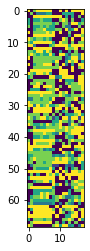

In [378]:
plt.imshow(users_np_0)

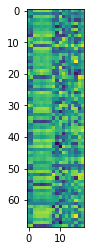

In [379]:
# much less sparse
plt.imshow(users_svd_predictions)

In [380]:
# find new predictions
users_new_predictions = users_svd_predictions - users_np_0

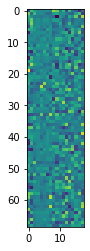

In [381]:
# uhh this is weird
plt.imshow(users_new_predictions)

In [382]:
users_new_predictions.shape

(69, 18)

In [383]:
np.max(users_svd_predictions)

6.532187788351061

In [384]:
users_svd_predictions

array([[ 2.78042231,  1.86852166,  4.87882714, ...,  3.64378965,
         2.05052432,  4.04180778],
       [ 2.73185575,  2.92955078,  1.759966  , ...,  0.84113354,
         1.90192489,  2.49798115],
       [ 1.3920102 ,  0.14141387,  4.54915662, ...,  2.51818016,
         2.19089778,  3.37050169],
       ...,
       [ 2.838921  ,  2.90358218,  3.70956214, ...,  1.06843807,
         3.86728855,  3.59782746],
       [ 1.79064704,  1.58209793,  4.72743471, ...,  4.14131989,
         0.7726577 ,  1.95215731],
       [ 4.38386837,  5.15359202, -0.41296917, ...,  0.71536537,
         2.97003362,  4.37853133]])

In [385]:
# translate to original ratings
predictions = users_svd_predictions

In [386]:
# https://docs.scipy.org/doc/numpy-1.13.0/reference/generated/numpy.round_.html
predictions = np.round(predictions)
predictions[predictions <= 0] = 0
predictions[predictions > 5] = 5
predictions

array([[3., 2., 5., ..., 4., 2., 4.],
       [3., 3., 2., ..., 1., 2., 2.],
       [1., 0., 5., ..., 3., 2., 3.],
       ...,
       [3., 3., 4., ..., 1., 4., 4.],
       [2., 2., 5., ..., 4., 1., 2.],
       [4., 5., 0., ..., 1., 3., 4.]])

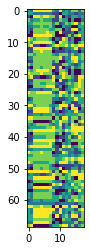

In [387]:
plt.imshow(predictions)

In [388]:
users_new_predictions = predictions - users_np_0

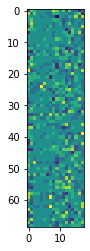

In [389]:
plt.imshow(users_new_predictions)

In [390]:
# did in fact change predictions by up to 5 increase/decrease
np.min(users_new_predictions)
np.max(users_new_predictions)

4.0

In [6]:
# see whole dataframe
# https://www.kite.com/python/answers/how-to-print-an-entire-pandas-dataframe-in-python
pd.set_option("display.max_rows", None, "display.max_columns", None)

In [392]:
# let's explore this in a nice way
predictions_pd = pd.DataFrame(predictions, columns = users_cr.columns)
predictions_pd.head()

Name,1984,Animal Farm,"Harry Potter and the Chamber of Secrets (Harry Potter, #2)","Harry Potter and the Goblet of Fire (Harry Potter, #4)","Harry Potter and the Half-Blood Prince (Harry Potter, #6)","Harry Potter and the Order of the Phoenix (Harry Potter, #5)","Harry Potter and the Prisoner of Azkaban (Harry Potter, #3)","Harry Potter and the Sorcerer's Stone (Harry Potter, #1)",Memoirs of a Geisha,Middlesex,Pride and Prejudice,Slaughterhouse-Five,The Catcher in the Rye,"The Da Vinci Code (Robert Langdon, #2)",The Great Gatsby,"The Hunger Games (The Hunger Games, #1)",The Kite Runner,To Kill a Mockingbird
0,3.0,2.0,5.0,5.0,5.0,5.0,5.0,5.0,3.0,2.0,5.0,2.0,3.0,2.0,4.0,4.0,2.0,4.0
1,3.0,3.0,2.0,2.0,2.0,2.0,2.0,2.0,1.0,1.0,0.0,3.0,3.0,2.0,2.0,1.0,2.0,2.0
2,1.0,0.0,5.0,5.0,4.0,5.0,5.0,4.0,4.0,1.0,5.0,0.0,2.0,1.0,3.0,3.0,2.0,3.0
3,4.0,2.0,3.0,3.0,4.0,3.0,3.0,3.0,1.0,1.0,4.0,3.0,3.0,0.0,3.0,0.0,0.0,2.0
4,3.0,3.0,4.0,4.0,4.0,4.0,4.0,4.0,2.0,4.0,1.0,2.0,4.0,3.0,4.0,5.0,2.0,4.0


In [393]:
users_rr.head()

Name,1984,Animal Farm,"Harry Potter and the Chamber of Secrets (Harry Potter, #2)","Harry Potter and the Goblet of Fire (Harry Potter, #4)","Harry Potter and the Half-Blood Prince (Harry Potter, #6)","Harry Potter and the Order of the Phoenix (Harry Potter, #5)","Harry Potter and the Prisoner of Azkaban (Harry Potter, #3)","Harry Potter and the Sorcerer's Stone (Harry Potter, #1)",Memoirs of a Geisha,Middlesex,Pride and Prejudice,Slaughterhouse-Five,The Catcher in the Rye,"The Da Vinci Code (Robert Langdon, #2)",The Great Gatsby,"The Hunger Games (The Hunger Games, #1)",The Kite Runner,To Kill a Mockingbird
ID,,,,,,,,,,,,,,,,,,
1,5.0,NaN,4.0,5.0,5.0,5.0,5.0,5.0,NaN,NaN,5.0,NaN,5.0,NaN,5.0,5.0,5.0,5.0
12,NaN,4.0,NaN,2.0,2.0,2.0,3.0,3.0,NaN,NaN,NaN,3.0,3.0,3.0,3.0,NaN,NaN,5.0
141,NaN,NaN,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,NaN,3.0,NaN,3.0,NaN,4.0,NaN
143,3.0,NaN,3.0,3.0,4.0,3.0,3.0,3.0,NaN,NaN,4.0,5.0,4.0,NaN,4.0,NaN,NaN,3.0
166,3.0,NaN,4.0,4.0,4.0,4.0,4.0,4.0,3.0,4.0,NaN,4.0,4.0,1.0,5.0,5.0,3.0,4.0


In [398]:
# remove predictions where already rated in original
# adapted from
# https://stackoverflow.com/questions/37754948/how-to-get-the-indices-list-of-all-nan-value-in-numpy-array
# https://stackoverflow.com/questions/2831516/isnotnan-functionality-in-numpy-can-this-be-more-pythonic/2831551
# https://stackoverflow.com/questions/6701714/numpy-replace-a-number-with-nan

predictions[~np.isnan(users_rr)] = np.nan
predictions

array([[nan,  2., nan, ..., nan, nan, nan],
       [ 3., nan,  2., ...,  1.,  2., nan],
       [ 1.,  0., nan, ...,  3., nan,  3.],
       ...,
       [nan,  3., nan, ...,  1., nan, nan],
       [ 2., nan, nan, ..., nan,  1.,  2.],
       [nan, nan,  0., ...,  1., nan, nan]])

In [459]:
# report predictions for test user
u_num = 24

# https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#selection-by-position
user_test = predictions_pd.iloc[u_num:u_num+1, :]

# take only best-rated recommendations
# leave out for now b/w not tons of 4s
# user_test = user_test[user_test >= 4]

# take only columns w/o NaN
# https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.dropna.html
user_test = user_test.dropna(axis = 1)

print(user_test)

# PyDA Ch. 8
user_test_long = pd.melt(user_test, value_name='Rating')

# top 3 recommendations
# https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.sort_values.html
user_test_long = user_test_long.sort_values('Rating', ascending = False)[:3]

# turn into list
# https://stackoverflow.com/questions/22341271/get-list-from-pandas-dataframe-column-or-row
recommendations = user_test_long['Name'].tolist()

recommendations

Name  1984  Animal Farm  \
24     0.0          0.0   

Name  Harry Potter and the Half-Blood Prince (Harry Potter, #6)  Middlesex  \
24                                                  4.0                1.0   

Name  Slaughterhouse-Five  The Catcher in the Rye  
24                    0.0                     1.0  


['Harry Potter and the Half-Blood Prince (Harry Potter, #6)',
 'Middlesex',
 'The Catcher in the Rye']

['Harry Potter and the Half-Blood Prince (Harry Potter, #6)',
 'Middlesex',
 'The Catcher in the Rye']

In [ ]:
# questions:

# do I need three book recommendations for every single user?
# format to return recommendations? as list?

In [498]:
# translate to original ratings
predictions = users_svd_predictions

# https://docs.scipy.org/doc/numpy-1.13.0/reference/generated/numpy.round_.html
predictions = np.round(predictions)
predictions[predictions <= 0] = 0
predictions[predictions > 5] = 5

# remove predictions where already rated in original
# adapted from
# https://stackoverflow.com/questions/37754948/how-to-get-the-indices-list-of-all-nan-value-in-numpy-array
# https://stackoverflow.com/questions/2831516/isnotnan-functionality-in-numpy-can-this-be-more-pythonic/2831551
# https://stackoverflow.com/questions/6701714/numpy-replace-a-number-with-nan
predictions[~np.isnan(users_rr)] = np.nan

# to pandas
predictions_pd = pd.DataFrame(predictions, columns = users_cr.columns)
predictions_pd

# https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.reset_index.html
predictions_pd = predictions_pd.reset_index()

# https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.rename.html
predictions_pd = predictions_pd.rename(columns={"index": "User"})

predictions_pd

# trying to get 3 recommendations for all users
# PyDA ch. 8
# https://pandas.pydata.org/docs/reference/api/pandas.melt.html
user_test_long = pd.melt(predictions_pd, id_vars = ["User"], value_name='Rating', ignore_index = False)

# sort for top recommendations
# https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.sort_values.html
user_test_long = user_test_long.sort_values('Rating', ascending = False)

# take top 3 recommendations for each user
# https://stackoverflow.com/questions/20069009/pandas-get-topmost-n-records-within-each-group
user_test_long = user_test_long.groupby('User').head(3)

# sort by user
user_test_long = user_test_long.sort_values('User')

# drop repeat (NaN) recommendations 
user_test_long = user_test_long.dropna()

# pivot back to 1 row per user?
#recommendations = user_test_long.pivot('')

user_test_long

,User,Name,Rating
0,0,Memoirs of a Geisha,3.0
0,0,Slaughterhouse-Five,2.0
0,0,Middlesex,2.0
1,1,The Kite Runner,2.0
1,1,1984,3.0
1,1,Harry Potter and the Chamber of Secrets (Harry...,2.0
2,2,"The Da Vinci Code (Robert Langdon, #2)",1.0
2,2,"The Hunger Games (The Hunger Games, #1)",3.0
2,2,To Kill a Mockingbird,3.0
3,3,Memoirs of a Geisha,1.0


,Name,Rating
59,Harry Potter and the Sorcerer's Stone (Harry P...,4.0
62,Harry Potter and the Sorcerer's Stone (Harry P...,4.0
39,To Kill a Mockingbird,4.0


In [ ]:
# old scratchwork:

In [ ]:
users.shape

In [178]:
U_small.shape

(609, 117)

In [179]:
users_svd.shape

(609, 5)

In [180]:
U_small[:, :2].shape

(609, 2)

In [181]:
S_small[:2]

array([220.99843654,  92.82745455])

In [182]:
# np.dot?

In [451]:
pd.melt?

In [3]:
'''Many broad approaches were brainstormed with Sophia Hager. Python for Data Analysis Chapter 8, Google, and cited Googled sources have been crucial to the data wrangling in this project. Any borrowed syntax/code is commented within the code block.'''
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def get_data():
    '''read in data from archive folder and return'''
    # read in data
    # from https://www.kaggle.com/bahramjannesarr/goodreads-book-datasets-10m
    books1 = pd.read_csv("./archive/user_rating_0_to_1000.csv")
    books2 = pd.read_csv("./archive/user_rating_1000_to_2000.csv")
    books = pd.concat([books1, books2])
    
    return books

def clean_data(books, nbook_ratings = 20, nuser_ratings = 5):
    '''take book rating data, return users x books w/ rating values as numpy array'''
    # https://www.programiz.com/python-programming/function-argument
    
    # filter out no ratings
    books = books[books['Rating'] != "This user doesn't have any rating"]
    
    # ratings to numeric from
    # https://datatofish.com/replace-values-pandas-dataframe/
    # https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.replace.html
    books = books.replace(['it was amazing', 'really liked it', 'liked it', 'it was ok', 'did not like it'],
                          [5, 4, 3, 2, 1])

    # pivot observations = users
    # from PyDA chapter 8
    users = books.pivot('ID', 'Name', 'Rating')

    # remove books w/ fewer than nbook_ratings ratings
    # https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.count.html
    # https://stackoverflow.com/questions/29281815/pandas-select-dataframe-columns-using-boolean
    users = users.loc[:, users.count() > nbook_ratings]

    # remove users who have rated fewer than nuser_ratings of these
    users = users[(users.count(axis = 1) > nuser_ratings)]

    # to numpy
    # thanks to Sophia for the dtype
    users_np = users.to_numpy(dtype = 'float')
    
    # also return book names as list
    book_names = users.columns
    
    return users_np, book_names

def predict(users_np, n = 5):
    '''return predictions using n dimensions of SVD'''
    # replace nan with 0
    # not in data cleaning b/c want nan in original data for later comparison
    # https://numpy.org/doc/stable/reference/generated/numpy.nan_to_num.html
    users_np = np.nan_to_num(users_np)
    
    # SVD
    U_small,S_small,V_small = np.linalg.svd(users_np,full_matrices=False)
    users_svd = U_small[:, :n] * S_small[:n]

    # return to original dimensions
    users_predictions = np.dot(users_svd, V_small[:n])
    
    # translate to original ratings
    # https://docs.scipy.org/doc/numpy-1.13.0/reference/generated/numpy.round_.html
    users_predictions = np.round(users_predictions)
    users_predictions[users_predictions <= 0] = 0
    users_predictions[users_predictions > 5] = 5
    
    return users_predictions

def make_recommendations(users, predictions, book_names):
    '''given user ratings and predicted ratings, recommend un-rated books'''
    # remove predictions where already rated in original
    # adapted from
    # https://stackoverflow.com/questions/37754948/how-to-get-the-indices-list-of-all-nan-value-in-numpy-array
    # https://stackoverflow.com/questions/2831516/isnotnan-functionality-in-numpy-can-this-be-more-pythonic/2831551
    # https://stackoverflow.com/questions/6701714/numpy-replace-a-number-with-nan
    predictions[~np.isnan(users)] = np.nan

    # to pandas
    predictions_pd = pd.DataFrame(predictions, columns = book_names)
    # https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.reset_index.html
    predictions_pd = predictions_pd.reset_index()
    # https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.rename.html
    predictions_pd = predictions_pd.rename(columns={"index": "User"})

    # trying to get 3 recommendations for all users
    
    # one rating per row
    # PyDA ch. 8
    # https://pandas.pydata.org/docs/reference/api/pandas.melt.html
    predictions_long = pd.melt(predictions_pd, id_vars = ["User"], value_name='Rating', ignore_index = False)

    # sort for top recommendations
    # https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.sort_values.html
    predictions_long = predictions_long.sort_values('Rating', ascending = False)

    # take top 3 recommendations for each user
    # https://stackoverflow.com/questions/20069009/pandas-get-topmost-n-records-within-each-group
    predictions_long = predictions_long.groupby('User').head(3)

    # sort by user
    predictions_long = predictions_long.sort_values('User')
    
    # don't recommend already rated (NaN) or 0-rated
    # https://datatofish.com/check-nan-pandas-dataframe/
    ratedNaN = predictions_long['Rating'].isnull()
    predictions_long['Name'][ratedNaN] = 'None'
    ratedZero = predictions_long['Rating'] == 0
    predictions_long['Name'][ratedZero] = 'None'
    
    # one recommendation per user
    # https://numpy.org/doc/stable/reference/generated/numpy.reshape.html
    recommend = np.reshape(predictions_long.to_numpy(), (predictions_long.shape[0]//3, 9))
    
    recommendations = pd.DataFrame(recommend, columns = ['User', 'Book 1', 'Rating 1',
                                                        'User_2', 'Book 2', 'Rating 2',
                                                        'User_3', 'Book 3', 'Rating 3'])
    
    # https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.drop.html
    recommendations = recommendations.drop(columns=['User_2', 'User_3'])
    
    return recommendations 

books = get_data()
users, book_names = clean_data(books, nbook_ratings = 20, nuser_ratings = 5)
predictions = predict(users)
recommendations = make_recommendations(users, predictions, book_names)
recommendations


<ipython-input-3-98026f0d0f32>:109: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  predictions_long['Name'][ratedNaN] = 'None'
<ipython-input-3-98026f0d0f32>:111: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  predictions_long['Name'][ratedZero] = 'None'


,User,Book 1,Rating 1,Book 2,Rating 2,Book 3,Rating 3
0,0,"A Game of Thrones (A Song of Ice and Fire, #1)",5,Hamlet,4,Animal Farm,4
1,1,The Nightingale,1,"The Subtle Knife (His Dark Materials, #2)",1,"The Golden Compass (His Dark Materials, #1)",1
2,2,Wuthering Heights,4,Of Mice and Men,4,Where the Sidewalk Ends,4
3,3,The Book Thief,1,The Nightingale,1,The Great Gatsby,1
4,4,The Catcher in the Rye,1,The Great Gatsby,1,Memoirs of a Geisha,1
...,...,...,...,...,...,...,...
489,489,To Kill a Mockingbird,2,Pride and Prejudice,2,Memoirs of a Geisha,2
490,490,None,0,None,0,None,0
491,491,The Sun Also Rises,2,The Adventures of Huckleberry Finn,3,Brave New World,2
492,492,The Stranger,1,The Great Gatsby,2,The Color Purple,1


In [4]:

users
#ratedZero

# https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.assign.html
# https://www.pythoncentral.io/one-line-if-statement-in-python-ternary-conditional-operator/

#recommendations.assign(
    #Rating2 = lambda df: df['Rating'] < 2
    #Test = lambda df: 'no' if df['Rating'] < 2 else df['Name']# .map(lambda rating: df['Name'] if rating >= 2 else "No") 
#) 


array([[nan,  5., nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan,  5., nan, ...,  3., nan, nan],
       [nan, nan, nan, ...,  1., nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])

In [2]:
import project1

recommendations = project1.recommendations

In [7]:
project1.users

Name,11/22/63,1984,A Christmas Carol,"A Clash of Kings (A Song of Ice and Fire, #2)",A Clockwork Orange,A Confederacy of Dunces,"A Dance with Dragons (A Song of Ice and Fire, #5)","A Discovery of Witches (All Souls Trilogy, #1)",A Farewell to Arms,"A Feast for Crows (A Song of Ice and Fire, #4)","A Game of Thrones (A Song of Ice and Fire, #1)",A Gentleman in Moscow,A Heartbreaking Work of Staggering Genius,A Light in the Attic,A Little Princess,A Long Way Down,A Man Called Ove,A Midsummer Night's Dream,A Million Little Pieces,A Moveable Feast,A Portrait of the Artist as a Young Man,A Prayer for Owen Meany,A Room with a View,A Separate Peace,A Short History of Nearly Everything,"A Storm of Swords (A Song of Ice and Fire, #3)",A Tale of Two Cities,A Thousand Splendid Suns,"A Time to Kill (Jake Brigance, #1)",A Tree Grows in Brooklyn,A Visit from the Goon Squad,A Walk in the Woods: Rediscovering America on the Appalachian Trail,"A Wrinkle in Time (Time Quintet, #1)",About a Boy,Alice's Adventures in Wonderland & Through the Looking-Glass,All the Light We Cannot See,"Allegiant (Divergent, #3)","American Gods (American Gods, #1)","American Pastoral (The American Trilogy, #1)",American Psycho,Americanah,An American Marriage,And Then There Were None,"Angela's Ashes (Frank McCourt, #1)","Angels & Demons (Robert Langdon, #1)",Animal Farm,Anna Karenina,"Anne of Green Gables (Anne of Green Gables, #1)",As I Lay Dying,Atlas Shrugged,Atonement,Beautiful Ruins,Becoming,Bel Canto,Beloved,Between the World and Me,Big Little Lies,Blindness,Blink: The Power of Thinking Without Thinking,"Born to Run: A Hidden Tribe, Superathletes, and the Greatest Race the World Has Never Seen",Bossypants,Brave New World,Breakfast at Tiffany's,Breakfast of Champions,"Breaking Dawn (Twilight, #4)",Bridge to Terabithia,"Bridget Jones's Diary (Bridget Jones, #1)",Candide,Cannery Row,Carrie,Cat's Cradle,Catch-22,"Catch-22 (Catch-22, #1)","Catching Fire (The Hunger Games, #2)","Charlie and the Chocolate Factory (Charlie Bucket, #1)",Charlotte's Web,Choke,Cien años de soledad,Circe,Cloud Atlas,Cold Mountain,"Crazy Rich Asians (Crazy Rich Asians, #1)",Crime and Punishment,Cryptonomicon,Cutting for Stone,Dark Places,David Copperfield,Digital Fortress,Disgrace,"Divergent (Divergent, #1)",Divine Secrets of the Ya-Ya Sisterhood,Dracula,"Dragonfly in Amber (Outlander, #2)",Dress Your Family in Corduroy and Denim,Dubliners,"Dune (Dune Chronicles, #1)",East of Eden,"Eat, Pray, Love","Eclipse (Twilight, #3)",Educated,Eleanor & Park,Eleanor Oliphant Is Completely Fine,Emma,Empire Falls,"Ender's Game (Ender's Saga, #1)",Even Cowgirls Get the Blues,Everything I Never Told You,Everything Is Illuminated,Extremely Loud & Incredibly Close,Fahrenheit 451,Fast Food Nation: The Dark Side of the All-American Meal,Fear and Loathing in Las Vegas,"Fifty Shades of Grey (Fifty Shades, #1)",Fight Club,Flowers for Algernon,"Foundation (Foundation, #1)",Frankenstein,Franny and Zooey,Freakonomics: A Rogue Economist Explores the Hidden Side of Everything,Freedom,From the Mixed-Up Files of Mrs. Basil E. Frankweiler,Galápagos,Geek Love,Girl with a Pearl Earring,Gone Girl,Gone with the Wind,"Good Omens: The Nice and Accurate Prophecies of Agnes Nutter, Witch","Good in Bed (Cannie Shapiro, #1)",Goodnight Moon,Great Expectations,"Guns, Germs, and Steel: The Fates of Human Societies",Hamlet,"Harry Potter and the Chamber of Secrets (Harry Potter, #2)","Harry Potter and the Deathly Hallows (Harry Potter, #7)","Harry Potter and the Goblet of Fire (Harry Potter, #4)","Harry Potter and the Half-Blood Prince (Harry Potter, #6)","Harry Potter and the Order of the Phoenix (Harry Potter, #5)","Harry Potter and the Prisoner of Azkaban (Harry Potter, #3)","Harry Potter and the Sorcerer's Stone (Harry Potter, #1)",Heart of Darkness,Her Fearful Symmetry,High Fidelity,Hillbilly Elegy: A Memoir of a Family and Culture in Crisis,Holidays on Ice,How to Be Good,I Know This Much Is True,"I Know Why the Caged Bird Sings (M

In [15]:
# return dataframe of titles a specific user has rated
u_num = 0

# https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#selection-by-position
user = project1.users.iloc[u_num:u_num+1, :]

# take only columns w/ recommendations
# https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.dropna.html
user = user.dropna(axis = 1)

pd.melt(user, var_name = 'Book', value_name='Rating')

,Book,Rating
0,1984,5.0
1,"A Clash of Kings (A Song of Ice and Fire, #2)",5.0
2,"A Dance with Dragons (A Song of Ice and Fire, #5)",5.0
3,"A Feast for Crows (A Song of Ice and Fire, #4)",4.0
4,A Midsummer Night's Dream,4.0
5,A Short History of Nearly Everything,5.0
6,"A Storm of Swords (A Song of Ice and Fire, #3)",5.0
7,A Thousand Splendid Suns,5.0
8,"A Time to Kill (Jake Brigance, #1)",2.0
9,A Visit from the Goon Squad,5.0


In [1]:
import project1
project1.get_user_ratings(0)

/Users/krh/Desktop/CSC294/projects/project-1-krhablutzel/project1.py:109: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  predictions_long['Name'][ratedNaN] = 'None'
/Users/krh/Desktop/CSC294/projects/project-1-krhablutzel/project1.py:111: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  predictions_long['Name'][ratedZero] = 'None'


,Book,Rating
0,1984,5.0
1,"A Clash of Kings (A Song of Ice and Fire, #2)",5.0
2,"A Dance with Dragons (A Song of Ice and Fire, #5)",5.0
3,"A Feast for Crows (A Song of Ice and Fire, #4)",4.0
4,A Midsummer Night's Dream,4.0
...,...,...
118,"Unbroken: A World War II Story of Survival, Re...",5.0
119,Where the Red Fern Grows,5.0
120,Where the Sidewalk Ends,5.0
121,Where the Wild Things Are,5.0


In [3]:
def get_user_recommendations(user_num):
    '''return dataframe of recommendations for a specific user'''
    # relies on recommendations existing as a global variable
    recs = recommendations.iloc[user_num:user_num+1, :]
    
    return recs

get_user_recommendations(0)

,User,Book 1,Rating 1,Book 2,Rating 2,Book 3,Rating 3
0,0,"A Game of Thrones (A Song of Ice and Fire, #1)",5,Hamlet,4,Animal Farm,4


NameError: name 'pd' is not defined

In [2]:
import pandas as pd
import numpy as np
import project1

In [ ]:
pd.set_option("display.max_rows", None, "display.max_columns", None)

In [2]:
project1.recommendations

,User,Book 1,Rating 1,Book 2,Rating 2,Book 3,Rating 3
0,0,"A Game of Thrones (A Song of Ice and Fire, #1)",5,Hamlet,4,Animal Farm,4
1,1,The Nightingale,1,"The Subtle Knife (His Dark Materials, #2)",1,"The Golden Compass (His Dark Materials, #1)",1
2,2,Wuthering Heights,4,Of Mice and Men,4,Where the Sidewalk Ends,4
3,3,The Book Thief,1,The Nightingale,1,The Great Gatsby,1
4,4,The Catcher in the Rye,1,The Great Gatsby,1,Memoirs of a Geisha,1
...,...,...,...,...,...,...,...
489,489,To Kill a Mockingbird,2,Pride and Prejudice,2,Memoirs of a Geisha,2
490,490,None,0,None,0,None,0
491,491,The Sun Also Rises,2,The Adventures of Huckleberry Finn,3,Brave New World,2
492,492,The Stranger,1,The Great Gatsby,2,The Color Purple,1


In [ ]:
project1.users

In [ ]:
project1.get_user_ratings(0)

In [ ]:
project1.get_user_recommendations(0)

In [ ]:
project1.get_user_ratings(0)

In [ ]:
project1.get_user_recommendations(0)

In [ ]:
# questions:
# output format for recommendations?

# use deep copy
# tests?
# weird error for assignment